In [910]:
import pickle
import pandas as pd
import xgboost

# import data

# open the dataset of your choice (major_df, house_df, all_df)
    
with open('datasets/district_stores_df.pkl', 'rb') as f:
    df = pickle.load(f)
    

df = df.drop(columns=['Unnamed: 0'], axis=1)
print(df.columns)




# do same for house districts
dist_population = 711000
# for col in dist_df.columns:
#     if col in ['district', 'party', 'blue']:
#         continue
#     dist_df[col] = dist_df[col].apply(lambda x: x / dist_population)   
    
    

pd.set_option('display.max_columns', None)


Index(['district', 'WholeFoods', 'TractorSupply', 'Starbucks', 'AcademySports',
       'DicksSports', 'BassPro', 'Grainger', 'CrackerBarrel', 'HarleyDavidson',
       'HM', 'LLBean', 'PotteryBarn', 'REI', 'TraderJoes', 'Costco',
       'ChickFilA', 'DollarTree', 'HobbyLobby', 'Target', 'Walmart', 'party',
       'blue'],
      dtype='object')


In [911]:
#!pip install sklearn


In [912]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
import xgboost as xgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score


import warnings
warnings.filterwarnings('ignore')


df.describe()





,WholeFoods,TractorSupply,Starbucks,AcademySports,DicksSports,BassPro,Grainger,CrackerBarrel,HarleyDavidson,HM,LLBean,PotteryBarn,REI,TraderJoes,Costco,ChickFilA,DollarTree,HobbyLobby,Target,Walmart,blue
count,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000
mean,1.089655,3.965517,30.997701,0.595402,1.685057,0.179310,0.832184,1.524138,1.765517,1.250575,0.124138,0.434483,0.351724,1.160920,1.268966,6.011494,16.933333,2.142529,4.202299,10.218391,0.547126
std,1.450809,3.873722,22.253411,1.194063,1.257102,0.418506,0.766146,1.728386,1.409385,1.060049,0.432804,0.690426,0.613193,1.737852,1.273200,5.545568,5.568399,1.604403,2.249525,5.815967,0.498347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,15.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,14.000000,1.000000,3.000000,6.000000,0.000000
50%,1.000000,3.000000,25.000000,0.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,4.000000,18.000000,2.000000,4.000000,10.000000,1.000000
75%,2.000000,7.000000,43.000000,1.000000,3.000000,0.000000,1.000000,2.000000,2.000000,2.000000,0.000000,1.000000,1.000000,2.000000,2.000000,9.000000,21.000000,3.000000,5.000000,14.000000,1.000000
max,10.000000,16.000000,139.000000,7.000000,6.000000,3.000000,5.000000,8.000000,8.000000,5.000000,5.000000,5.000000,3.000000,17.000000,6.000000,33.000000,34.000000,8.000000,15.000000,40.000000,1.000000


In [925]:
# I am choosing to train on the 3000+ counties in the USA, and test on the 435 congressional districts 
# to predict the congressional race for 2018

# Make my X and y data  AND FEATURE SELECTION
y = df['blue']



extra_cols = ['party', 'blue', 'district']

drop_cols = ['BassPro',
             'REI',
             'LLBean',
             'PotteryBarn',
             'Grainger',
             'Costco',
             'DicksSports',
             'HM',
             'HarleyDavidson',
             'AcademySports',
             'ChickFilA',
             'WholeFoods',
             'TraderJoes',
             'Target',
             #'Walmart',
             #'TractorSupply',
             #'HobbyLobby'
            ]
'''            
    [(7, 'WholeFoods'),
 (1, 'TractorSupply'),
 (1, 'Starbucks'),
 (5, 'AcademySports'),
 (9, 'DicksSports'),
 (15, 'BassPro'),
 (14, 'Grainger'),
 (1, 'CrackerBarrel'),
 (5, 'HarleyDavidson'),
 (8, 'HM'),
 (12, 'LLBean'),
 (12, 'PotteryBarn'),
 (15, 'REI'),
 (2, 'TraderJoes'),
 (11, 'Costco'),
 (4, 'ChickFilA'),
 (3, 'DollarTree'),
 (1, 'HobbyLobby'),
 (9, 'Target'),
 (1, 'Walmart')]
'''
X = df.drop(columns=extra_cols+drop_cols)



,TractorSupply,Starbucks,CrackerBarrel,DollarTree,HobbyLobby,Walmart
0,8,15,5,29,4,21
1,10,7,3,20,3,18
2,8,10,5,24,4,19
3,11,2,5,21,5,16
4,4,15,6,19,4,17


In [914]:
df['blue'].sum()
df['party'].value_counts()  # vals are same.  Just verification
X.columns

Index(['TractorSupply', 'Starbucks', 'CrackerBarrel', 'DollarTree',
       'HobbyLobby', 'Walmart'],
      dtype='object')

In [915]:
# Scale my data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [916]:
# Split my data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# XGBoost model

In [917]:
# We will skip scaling of the data.  It is already all in the same units (stores per 10k population)
# The data is very homogenous at this point

# after we do the model, we can trim the fat.  Not all stores will be important.

# MAKE A BASELINE MODEL

xg_clf = xgb.XGBClassifier()

xg_clf.fit(X_train, y_train)

training_preds = xg_clf.predict(X_train)
val_preds = xg_clf.predict(X_test)

training_accuracy = accuracy_score(y_train, training_preds)
val_accuracy = accuracy_score(y_test, val_preds)

print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
print("Validation accuracy: {:.4}%".format(val_accuracy * 100))

Training Accuracy: 100.0%
Validation accuracy: 70.11%


In [918]:
# TUNING
param_grid = {
    "learning_rate": [0.05],  
    'n_estimators': [100, 500, 1000],
    'max_depth': [3, 4, 5], # prevent over/under fitting
    'min_child_weight': [1],
    'colsample_bytree':[0.9],  #0 to 1
    'subsample': [0.85],
    #'gamma': [0, 0.1, 0.2,],
    'scale_pos_weight': [0.5],
    
}
print(len(df[df['blue']==1])/len(df))

0.5471264367816092


In [919]:
xg_grid_clf = GridSearchCV(xg_clf, param_grid, scoring='f1', cv=5, n_jobs=1)
xg_grid_clf.fit(X_train, y_train)

best_parameters = xg_grid_clf.best_params_

print("Grid Search found the following optimal parameters: ")
for param_name in sorted(best_parameters.keys()):
    print("%s: %r" % (param_name, best_parameters[param_name]))

training_preds = xg_grid_clf.predict(X_train)
val_preds = xg_grid_clf.predict(X_test)
training_accuracy = accuracy_score(y_train, training_preds)
val_accuracy = accuracy_score(y_test, val_preds)

print("")
print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
print("Validation accuracy: {:.4}%".format(val_accuracy * 100))

Grid Search found the following optimal parameters: 
colsample_bytree: 0.9
learning_rate: 0.05
max_depth: 4
min_child_weight: 1
n_estimators: 1000
scale_pos_weight: 0.5
subsample: 0.85

Training Accuracy: 99.71%
Validation accuracy: 70.11%


0       TractorSupply	Score: 0.3973
1           Starbucks	Score: 0.07536
2       CrackerBarrel	Score: 0.08637
3          DollarTree	Score: 0.109
4          HobbyLobby	Score: 0.1717
5             Walmart	Score: 0.1603


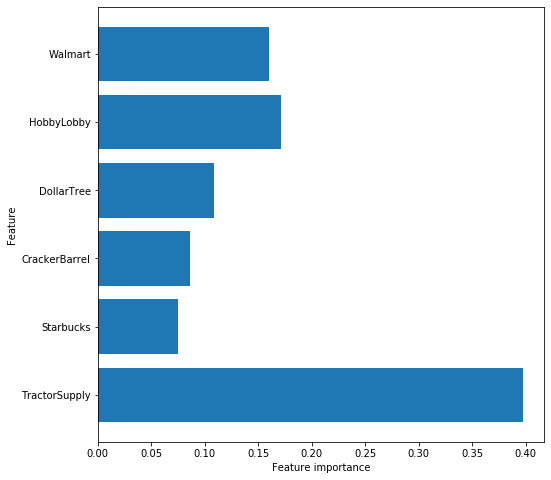

In [920]:



# xgboost for feature importance on a regression problem
from sklearn.datasets import make_regression
from xgboost import XGBRegressor
from matplotlib import pyplot

def plot_feature_importances(model):
    n_features = X.shape[1]
    plt.figure(figsize=(8,8))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X.columns.values) 
    plt.xlabel('Feature importance')
    plt.ylabel('Feature')




# model = XGBRegressor()
# # fit the model
# model.fit(X, y)
# # get importance
importance = xg_clf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('{}{:>20}\tScore: {:.4}'.format(i, X.columns[i],v))
# plot feature importance

plot_feature_importances(xg_clf)

In [809]:
X.columns

Index(['TractorSupply', 'Starbucks', 'CrackerBarrel', 'DollarTree',
       'HobbyLobby', 'Walmart'],
      dtype='object')

In [810]:
print(xg_clf.feature_importances_)

[0.39732078 0.07535534 0.0863655  0.10896875 0.17166547 0.16032411]


In [811]:
# RANDOM FOREST TRY
import pandas as pd
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

In [812]:
# Instantiate and fit a DecisionTreeClassifier
np.random.seed(337)

tree_clf = DecisionTreeClassifier(criterion='gini', max_depth=5) 
tree_clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

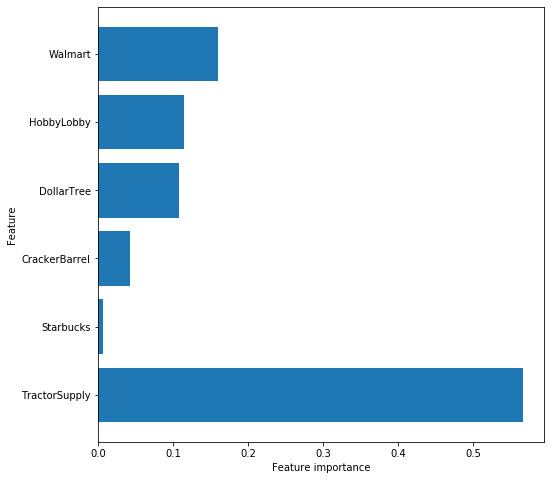

In [813]:
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(8,8))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X.columns.values) 
    plt.xlabel('Feature importance')
    plt.ylabel('Feature')

plot_feature_importances(tree_clf)


In [814]:
from sklearn.metrics import accuracy_score

y_pred = tree_clf.predict(X_test)
accuracy_score(y_pred, y_test)

df.describe()

,WholeFoods,TractorSupply,Starbucks,AcademySports,DicksSports,BassPro,Grainger,CrackerBarrel,HarleyDavidson,HM,LLBean,PotteryBarn,REI,TraderJoes,Costco,ChickFilA,DollarTree,HobbyLobby,Target,Walmart,blue
count,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000,435.000000
mean,1.089655,3.965517,30.997701,0.595402,1.685057,0.179310,0.832184,1.524138,1.765517,1.250575,0.124138,0.434483,0.351724,1.160920,1.268966,6.011494,16.933333,2.142529,4.202299,10.218391,0.547126
std,1.450809,3.873722,22.253411,1.194063,1.257102,0.418506,0.766146,1.728386,1.409385,1.060049,0.432804,0.690426,0.613193,1.737852,1.273200,5.545568,5.568399,1.604403,2.249525,5.815967,0.498347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,15.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,14.000000,1.000000,3.000000,6.000000,0.000000
50%,1.000000,3.000000,25.000000,0.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,4.000000,18.000000,2.000000,4.000000,10.000000,1.000000
75%,2.000000,7.000000,43.000000,1.000000,3.000000,0.000000,1.000000,2.000000,2.000000,2.000000,0.000000,1.000000,1.000000,2.000000,2.000000,9.000000,21.000000,3.000000,5.000000,14.000000,1.000000
max,10.000000,16.000000,139.000000,7.000000,6.000000,3.000000,5.000000,8.000000,8.000000,5.000000,5.000000,5.000000,3.000000,17.000000,6.000000,33.000000,34.000000,8.000000,15.000000,40.000000,1.000000


In [815]:
# RANDOM FOREST CONTINUED 

import pandas as pd
import numpy as np
np.random.seed(1)
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

## Random Forest Classifier

In [816]:
# Instantiate and fit a RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score


forest = RandomForestClassifier()

forest.fit(X_train, y_train)
mean_rf_cv_score_train = np.mean(cross_val_score(forest, X_train, y_train, cv=5))

mean_rf_cv_score = np.mean(cross_val_score(forest, X_test, y_test, cv=5))

print(f"Mean Cross Validation Score for Random Forest Classifier Train: {mean_rf_cv_score_train :.2%}")
print(f"Mean Cross Validation Score for Random Forest Classifier Test: {mean_rf_cv_score :.2%}")

Mean Cross Validation Score for Random Forest Classifier Train: 81.31%
Mean Cross Validation Score for Random Forest Classifier Test: 74.77%


In [885]:
# TUNING
rf_param_grid = {
    'n_estimators': [1000],
    'criterion': ['gini', 'entropy'],
    #'max_depth': [3,4,5,6,7,8],
    #'min_samples_split': [3,4,5,6,7],
    #'min_samples_leaf': [4,5,6],
    'class_weight': [{0:1, 1:2}]
}


rf_param_grid = {
    'bootstrap': [True],
    'n_estimators': [500],  # tried 400 to 1000
    'criterion': ['entropy', 'gini'],
    'max_depth': [4], #(tried 4 to 5)
    'min_samples_split': [5], 
    'min_samples_leaf': [5],  # tried 2 to 10
    #'class_weight': ['balanced'] # selected balanced so no weight assigned
}

In [891]:
grid_clf = GridSearchCV(forest, rf_param_grid, scoring='accuracy', cv=5, n_jobs=1)
grid_clf.fit(X_train, y_train)

best_parameters = grid_clf.best_params_

print("Grid Search found the following optimal parameters: ")
for param_name in sorted(best_parameters.keys()):
    print("%s: %r" % (param_name, best_parameters[param_name]))

training_preds = grid_clf.predict(X_train)
val_preds = grid_clf.predict(X_test)
training_accuracy = accuracy_score(y_train, training_preds)
val_accuracy = accuracy_score(y_test, val_preds)

print("")
print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
print("Validation accuracy: {:.4}%".format(val_accuracy * 100))

Grid Search found the following optimal parameters: 
bootstrap: True
criterion: 'gini'
max_depth: 4
min_samples_leaf: 5
min_samples_split: 5
n_estimators: 500

Training Accuracy: 85.92%
Validation accuracy: 78.16%


In [892]:
# print('train', forest.score(X_train, y_train))
# print('test', forest.score(X_test, y_test))




In [893]:
#forest.fit(X_train, y_train)
import itertools





#plot_feature_importances(forest)
cm_rf = confusion_matrix(y_test, grid_clf.predict(X_test))
cm_rf

array([[34, 12],
       [ 7, 34]])

## Boruta Feature Selection

In [787]:
#!pip install boruta

In [788]:

import pandas
from sklearn.ensemble import RandomForestClassifier
from boruta import BorutaPy
 
# load X and y  DONE
# X = pd.read_csv('my_X_table.csv', index_col=0).values
# y = pd.read_csv('my_y_vector.csv', index_col=0).values
 
# define random forest classifier, with utilising all cores and
# sampling in proportion to y labels DONE
#forest = RandomForestClassifier(n_jobs=-1, class_weight='auto')
 
# define Boruta feature selection method
feat_selector = BorutaPy(forest, n_estimators='auto', verbose=2)
 
# find all relevant features
feat_selector.fit(X_train.values, y_train.values)
 
# # check selected features
feat_selector.support_
 
# # check ranking of features
feat_selector.ranking_
 
# # call transform() on X to filter it down to selected features
X_filtered = feat_selector.transform(X_train.values)


Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	2
Tentative: 	3
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	2
Tentative: 	3
Rejected: 	0
Iteration: 	10 / 100
Confirmed: 	2
Tentative: 	3
Rejected: 	0
Iteration: 	11 / 100
Confirmed: 	2
Tentative: 	3
Rejected: 	0
Iteration: 	12 / 100
Confirmed: 	3
Tentative: 	2
Rejected: 	0
Iteration: 	13 / 100
Confirmed: 	3
Tentative: 	2
Rejected: 	0
Iteration: 	14 / 100
Confirmed: 	3
Tentative: 	2
Rejected: 	0
Iteration: 	15 / 100
Confirmed: 	3
Tentative: 	2
Rejected: 	0
Iteration: 	16 / 100
Confirmed: 	3
Tentative: 	2
Rejected: 	0
Iteration: 	17 / 

In [789]:
list(zip(feat_selector.ranking_, X.columns))

[(1, 'TractorSupply'),
 (1, 'Starbucks'),
 (1, 'CrackerBarrel'),
 (1, 'DollarTree'),
 (1, 'Walmart')]

In [457]:
import plotly.express as px
from urllib.request import urlopen


def make_choro(df, geojson, col, color_list, range_color):
    fig = px.choropleth(df, 
                        geojson=geojson, 
                        locations='fips', 
                        color=col,
                        #color_discrete_sequence=px.colors.qualitative.Set1,
                        color_continuous_scale=color_list,
                        range_color=range_color,
                        scope="usa",
            #                     labels={'WholeFoods':'Whole Foods',
            #                             'county': 'County'},
                        hover_name='county',
                        hover_data=[col, 'party'],
                    )
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    us_county_fix = json.load(response)



In [458]:
import plotly.express as px
df['pred'] = grid_clf.predict(X)
#make_choro(df, us_county_fix, 'pred', ['red', 'blue'], [0, 1])
#make_choro(df, us_county_fix, 'blue', ['red', 'blue'], [0, 1])


## Try our model on congressional districts

In [459]:
import geopandas as gpd

finalvotes_df = pd.read_pickle('datasets/finalvotes_df.pkl')
dist_df = pd.read_pickle('datasets/district_stores_df.pkl')

In [928]:
# MAKE A GEOPANDAS DF
# load my geojson file which contains my Polygons
boundary_file = "datasets/dist3.geojson"
geo_data = gpd.read_file(boundary_file)   


abbrev_dict = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY',
    'District Of Columbia': 'DC',
}

codes = []

# Make the codes in geo and df match
geo_data['DISTRICT'] = geo_data['DISTRICT'].apply(lambda x: '1' if x=='0' else x)



for i in range(len(geo_data)):
    code = '{}-{:02}'.format(abbrev_dict[geo_data.iloc[i]['STATENAME']], int(geo_data.iloc[i]['DISTRICT']))
    codes.append(code)
    
geo_data['Code'] = codes
#geo_data['DISTRICT'] = geo_data['DISTRICT'].apply(lambda x: str(x))

finalvotes_df.iloc[:]['Code'] = finalvotes_df['district']
finalvotes_df['district'] = finalvotes_df['district'].apply(lambda x: str(x))



# df['Code'].unique()
# finalvotes_df['Code'].unique()
geo_data.head()



# MAYBE I NEED TO PUT THE PARTY INTO THE geo_data?????
party = []


#for i in range(len(geo_data)):
for i in range(10):
    party = finalvotes_df[finalvotes_df['Code']==geo_data.iloc[i]['Code']]['party']
    print(party)
    
geo_data['party'] = party
geo_data.head()

Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)
Series([], Name: party, dtype: object)


,STATENAME,ID,DISTRICT,STARTCONG,ENDCONG,DISTRICTSI,COUNTY,PAGE,LAW,NOTE,BESTDEC,FINALNOTE,RNOTE,LASTCHANGE,FROMCOUNTY,geometry,Code,party
0,Louisiana,022113114006,6,113,114,,,,,,,"{""From US Census website""}",,2016-05-29T16:44:10.857626,False,"POLYGON ((-90.57000 30.53000, -90.57000 30.540...",LA-06,NaN
1,Maine,023113114001,1,113,114,,,,,,,"{""From US Census website""}",,2016-05-29T16:44:10.857626,False,"MULTIPOLYGON (((-70.99000 43.79000, -70.99000 ...",ME-01,NaN
2,Maine,023113114002,2,113,114,,,,,,,"{""From US Census website""}",,2016-05-29T16:44:10.857626,False,"MULTIPOLYGON (((-67.20000 44.91000, -67.19000 ...",ME-02,NaN
3,Maryland,024113114001,1,113,114,,,,,,,"{""From US Census website""}",,2016-05-29T16:44:10.857626,False,"MULTIPOLYGON (((-77.22000 39.72000, -77.21000 ...",MD-01,NaN
4,Maryland,024113114002,2,113,114,,,,,,,"{""From US Census website""}",,2016-05-29T16:44:10.857626,False,"MULTIPOLYGON (((-76.63000 39.27000, -76.64000 ...",MD-02,NaN


In [927]:
###### FIX ME




training_preds = grid_clf.predict(X_train)
val_preds = grid_clf.predict(X_test)
training_accuracy = accuracy_score(y_train, training_preds)
val_accuracy = accuracy_score(y_test, val_preds)

print("")
print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
print("Validation accuracy: {:.4}%".format(val_accuracy * 100))


preds = grid_clf.predict(X)
df['pred'] = preds


Training Accuracy: 85.92%
Validation accuracy: 78.16%


In [462]:

import folium


import folium
import json
import numpy as np
import branca.colormap as cm

# create a LinearColorMap and assign colors, vmin, and vmax
# the colormap will show green for $100,000 homes all the way up to red for $1,500,000 homes
colormap = cm.LinearColormap(colors=['red', 'blue'], vmin=0, vmax=1)


center= (39.8283, -98.5795,)

def my_color_function(feature):
    """Maps low values to red and high values to blue."""
    if feature == 1:
        return '#0000FF'
    else:
        return '#FF0000'

def folium_del_legend(choropleth: folium.Choropleth):
  """A hack to remove choropleth legends.
  
  The choropleth color-scaled legend sometimes looks too crowded. Until there is an
  option to disable the legend, use this routine to remove any color map children
  from the choropleth.
  
  Args:
    choropleth: Choropleth objected created by `folium.Choropleth()`
    
  Returns:
    The same object `choropleth` with any child whose name starts with
    'color_map' removed.
  """
  del_list = []
  for child in choropleth._children:
    if child.startswith('color_map'):
      del_list.append(child)
  for del_item in del_list:
    choropleth._children.pop(del_item)
  return choropleth
    
    
# Initialize Folium Map again (same as before)
m = folium.Map(location=center, 
               zoom_start=4,
               tiles='Stamen Toner')


# Create choropleth map  

folium_del_legend(folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df,
    columns=['district', 'pred'],
    key_on='feature.properties.Code', 
    fill_color='Spectral',
    line_width=1,
    fill_opacity=0.6,
    #nan_fill_opacity=0,
    #line_opacity=1,
    #legend_name='Stores',
).add_to(m))



m



In [400]:
import pandas as pd
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

In [401]:
# BAGGING

# Instantiate a BaggingClassifier
bagged_tree =  BaggingClassifier(DecisionTreeClassifier(criterion='entropy',
                                                        max_depth=6,
                                                        min_samples_leaf=4,
                                                        min_samples_split=5,
                                                       )
                                                        ,n_estimators=1000)
                                                        

# Fit to the training data
bagged_tree.fit(X_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='entropy',
                                                        max_depth=6,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=4,
                                                        min_samples_split=5,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=None,


In [402]:
bagged_tree.score(X_train, y_train)


0.8926380368098159

In [403]:
bagged_tree.score(X_test, y_test)


0.7706422018348624